# Shalesh - Taxi Dataset Insights

### Date: 6 October 2020      

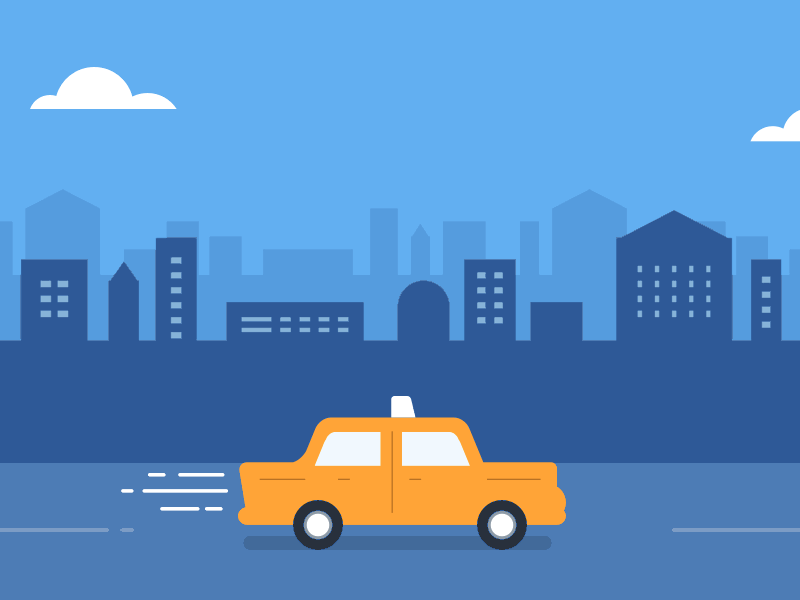

## Importing Libraries

In [1]:
import pandas as pd
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import matplotlib.pyplot as plt
import plotly_express as px

## Q1- Read Dataset

In [2]:
# Read the data into the Python file
data = pd.read_csv("train.csv")

In [3]:
# Print the data
data.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


In [4]:
# Check the names of the columns
list(data.columns)

['id',
 'vendor_id',
 'pickup_datetime',
 'dropoff_datetime',
 'passenger_count',
 'pickup_longitude',
 'pickup_latitude',
 'dropoff_longitude',
 'dropoff_latitude',
 'store_and_fwd_flag',
 'trip_duration']

Info about the data columns 

-  id - a unique identifier for each trip
-  vendor_id - a code indicating the provider associated with the trip record
-  pickup_datetime - date and time when the meter was engaged
-  dropoff_datetime - date and time when the meter was disengaged
-  passenger_count - the number of passengers in the vehicle (driver entered value)
-  pickup_longitude - the longitude where the meter was engaged
-  pickup_latitude - the latitude where the meter was engaged
-  dropoff_longitude - the longitude where the meter was disengaged
-  dropoff_latitude - the latitude where the meter was disengaged
-  store_and_fwd_flag - This flag indicates whether the trip record was held in vehicle memory before sending to the vendor because the vehicle did not have a connection to the server - Y=store and forward; N=not a store and forward trip
-  trip_duration - duration of the trip in seconds

## Q2- Exploratory Data Analysis

In [5]:
# Check for the number of rows & columns
data.shape

(1458644, 11)

In [6]:
# Check the statistical components of the data
data.describe()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
count,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06
mean,1.534950e+00,1.664530e+00,-7.397349e+01,4.075092e+01,-7.397342e+01,4.075180e+01,9.594923e+02
std,4.987772e-01,1.314242e+00,7.090186e-02,3.288119e-02,7.064327e-02,3.589056e-02,5.237432e+03
min,1.000000e+00,0.000000e+00,-1.219333e+02,3.435970e+01,-1.219333e+02,3.218114e+01,1.000000e+00
25%,1.000000e+00,1.000000e+00,-7.399187e+01,4.073735e+01,-7.399133e+01,4.073588e+01,3.970000e+02
50%,2.000000e+00,1.000000e+00,-7.398174e+01,4.075410e+01,-7.397975e+01,4.075452e+01,6.620000e+02
75%,2.000000e+00,2.000000e+00,-7.396733e+01,4.076836e+01,-7.396301e+01,4.076981e+01,1.075000e+03
max,2.000000e+00,9.000000e+00,-6.133553e+01,5.188108e+01,-6.133553e+01,4.392103e+01,3.526282e+06


In [7]:
# Find the type of columns in the data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458644 entries, 0 to 1458643
Data columns (total 11 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   id                  1458644 non-null  object 
 1   vendor_id           1458644 non-null  int64  
 2   pickup_datetime     1458644 non-null  object 
 3   dropoff_datetime    1458644 non-null  object 
 4   passenger_count     1458644 non-null  int64  
 5   pickup_longitude    1458644 non-null  float64
 6   pickup_latitude     1458644 non-null  float64
 7   dropoff_longitude   1458644 non-null  float64
 8   dropoff_latitude    1458644 non-null  float64
 9   store_and_fwd_flag  1458644 non-null  object 
 10  trip_duration       1458644 non-null  int64  
dtypes: float64(4), int64(3), object(4)
memory usage: 122.4+ MB


In [8]:
# Check for missing data
total = data.isnull().sum().sort_values(ascending=False)
percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
trip_duration,0,0.0
store_and_fwd_flag,0,0.0
dropoff_latitude,0,0.0
dropoff_longitude,0,0.0
pickup_latitude,0,0.0
pickup_longitude,0,0.0
passenger_count,0,0.0
dropoff_datetime,0,0.0
pickup_datetime,0,0.0
vendor_id,0,0.0


##### <font color=red> There are no data missing or null values in any of the fields. So, we can proceed ahead as the data seems to be clean.

In [9]:
# Define a function for the histogram plot
def plot_hist(variable):
    plt.figure(figsize = (9,3))
    plt.hist(data[variable], bins = 50)
    plt.xlabel(variable)
    plt.ylabel("Frequency")
    plt.title("{} distribution with hist".format(variable))
    plt.show()

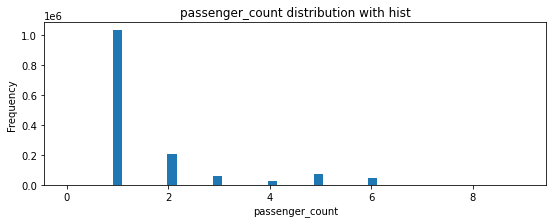

In [10]:
# Plot the histogram for passenger count
numericVar = ['passenger_count']
for n in numericVar:
    plot_hist(n)

##### <font color=red> We can note from the above plot that the maximum number of passengers who have travelled in the taxi are 1 at a time with 4 persons being the lowest of the given frequencies. Also, here is an interesting link which states why people love to travel alone

- https://wikitravel.org/en/Travelling_alone
    

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002650BA1E588>,
      dtype=object)

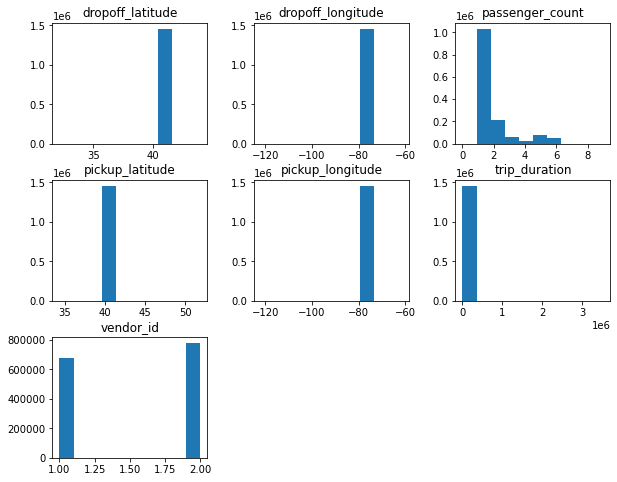

In [11]:
# Plotting histograms for all the numerical variables 
data.hist(bins=10,figsize=(10,8),grid=False)

##### <font color=red> The interesting point to note here is that most of the trips were around a common place which means aroun New York and there are only 2 vendors whose taxis are running all over the city.

In [12]:
# Plotting the places where the pickup event occurs

import folium # goelogical map
map_1 = folium.Map(location=[40.767937,-73.982155 ],tiles='OpenStreetMap',
 zoom_start=12)
#tile: 'OpenStreetMap','Stamen Terrain','Mapbox Bright','Mapbox Control room'
for each in data[:1000].iterrows():
    folium.CircleMarker([each[1]['pickup_latitude'],each[1]['pickup_longitude']],
                        radius=0.1,
                        color='darkgreen',
                        popup=str(each[1]['pickup_latitude'])+','+str(each[1]['pickup_longitude']),
                        fill_color='#FD8A6C'
                        ).add_to(map_1)
map_1

##### <font color=red> We can infer from the map that apart from most pickup locations being from the city of New York, some of them were from the outskirts and the others were from the nearby Gateway National Recreation Area being the most far away from the main city.

In [13]:
# Plotting the places where the dropoff event occurs

import folium # goelogical map
map_2 = folium.Map(location=[40.767937,-73.982155 ],tiles='OpenStreetMap',
 zoom_start=12)
#tile: 'OpenStreetMap','Stamen Terrain','Mapbox Bright','Mapbox Control room'
for each in data[:1000].iterrows():
    folium.CircleMarker([each[1]['dropoff_latitude'],each[1]['dropoff_longitude']],
                        radius=0.1,
                        color='blue',
                        popup=str(each[1]['dropoff_latitude'])+','+str(each[1]['dropoff_longitude']),
                        fill_color='#FD8A6C'
                        ).add_to(map_2)
map_2

##### <font color=red> The dropoff map shows quite interesting characteristics that the most far away dropoff places were Stamford, Elizabeth & Hampstead with surrounding the main city of New York.

## Q3- Reverse geocoding for getting place names

In [14]:
# Saving the geographic cordinates into different lists 
datalong1=data['pickup_longitude']
datalat1=data['pickup_latitude']
datalong2=data['dropoff_longitude']
datalat2=data['dropoff_latitude']

In [15]:
# Creating a dataframe of the combined 2 lists
cv=pd.DataFrame(list(zip(datalat1,datalong1)),columns=['lat','long'])

In [16]:
# Dropping the duplicate 
az=pd.DataFrame.drop_duplicates(cv)

In [17]:
# Printing the dataframe
az

,lat,long
0,40.767937,-73.982155
1,40.738564,-73.980415
2,40.763939,-73.979027
3,40.719971,-74.010040
4,40.793209,-73.973053
...,...,...
1458639,40.745522,-73.982201
1458640,40.747379,-74.000946
1458641,40.768799,-73.959129
1458642,40.749062,-73.982079


##### <font color=red> Since, the number of unique pairs of latitudes and longitudes are around 1381253, which means that reverse geocoding of this data is going to take much time. Also location of places which differs by a magnitude of around 0.001 longitude and latitudes is going to be same. So, we are going to round off the coordinates to 3 decimal places and remove the duplicates.

## Reverse Geocoding function

In [18]:
# Defining a function to extract name of the place 
import reverse_geocoder as rg 
  
def reverseGeocode(coordinates): 
    result = rg.search(coordinates) 
    return result

In [19]:
# Checking the name of the place 
coordinates =(40.765,-73.964) 
a=reverseGeocode(coordinates)

Loading formatted geocoded file...


In [20]:
# Priniting the result
a[0]

OrderedDict([('lat', '40.78343'),
             ('lon', '-73.96625'),
             ('name', 'Manhattan'),
             ('admin1', 'New York'),
             ('admin2', 'New York County'),
             ('cc', 'US')])

## Round off the coordinates to 3 decimal places

In [21]:
# Running a loop for rounding off latitude & longitude for easy calculation of places
ma=[]
mb=[]
mc=[]
md=[]
i=0
while(i<len(datalat1)):
    ma.append(round(datalat1[i],3))
    mb.append(round(datalong1[i],3))
    mc.append(round(datalat2[i],3))
    md.append(round(datalong2[i],3))
    i+=1

In [22]:
# Saving the pickup coordinates list in a new dataframe
df1=pd.DataFrame(list(zip(ma,mb)),columns=['lat','long'])

In [23]:
# Checking the number of rows & columns
df1.shape

(1458644, 2)

In [28]:
# Drop the duplicate values from the pickup dataframe
za=pd.DataFrame.drop_duplicates(df1)

In [29]:
# Exporting the file to csv format
za.to_csv('ll.csv',index=False)

In [30]:
# Reading the pickup location file
za=pd.read_csv('ll.csv')

In [31]:
# Selecting the columns from the dataframes
aa=za['lat']
ab=za['long']

In [32]:
# Printing the dataframe
aa

0        40.768
1        40.739
2        40.764
3        40.720
4        40.793
          ...  
13019    40.872
13020    40.782
13021    40.652
13022    40.678
13023    40.769
Name: lat, Length: 13024, dtype: float64

In [50]:
# Running a loop for the Pickup locations with cordinates
ac=[]
i=0
while(i<len(aa)):
    coordinates =(aa[i],ab[i]) 
    a=reverseGeocode(coordinates)
    ac.append(a[0]['name'])
    print(i)
    i+=1

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [33]:
# Rounding off the decimal places of some rows to 3
ga=[]
for each in aa:
    ga.append(round(each,3))
gb=[]
for each in ab:
    gb.append(round(each,3))

In [79]:
# Making a new dataframe from the above loop
df_result=pd.DataFrame(list(zip(ga,gb,ac)),columns=['lat','long','name'])

In [76]:
# Making a readable csv file
df_result.to_csv('namesupdated.csv',index=False)

In [45]:
# Reading data
pickup=pd.read_csv('namesupdated.csv')

In [49]:
# Making a left join to have the pickup places name
merged1=pd.merge(how='left',left=df1,right=pickup,on=['lat','long'])

In [51]:
# Exporting to csv
merged1.to_csv('pickup.csv')

In [34]:
# Creating a dataframe for droping locations
df2=pd.DataFrame(list(zip(mc,md)),columns=['lat','long'])

In [35]:
# Checking number of rows and columns
df2.shape

(1458644, 2)

In [36]:
# Dropping duplicate values
zb=pd.DataFrame.drop_duplicates(df2)

In [37]:
# Export to csv
zb.to_csv('ll2.csv',index=False)

In [38]:
# Reading the file 
zb=pd.read_csv('ll2.csv')

In [39]:
# Selecting required columns into a dataframe
aaa=zb['lat']
aba=zb['long']

In [40]:
# Printing the dataframe
aaa

0        40.766
1        40.731
2        40.710
3        40.707
4        40.783
          ...  
31444    40.616
31445    40.604
31446    40.797
31447    40.652
31448    40.642
Name: lat, Length: 31449, dtype: float64

In [ ]:
# Running a loop for first half to find out dropoff location place names
acc=[]
na=[]
nb=[]
i=0
while(i<len(aaa)):
    coordinates =(aaa[i],aba[i]) 
    a=reverseGeocode(coordinates)
    acc.append(a[0]['name'])
    print(i)
    na.append(round(aaa[i],3))
    nb.append(round(aba[i],3))
    lp=pd.DataFrame(list(zip(na,nb,acc)),columns=['lat','long','dropoff_name'])
    lp.to_csv('dropoff_names.csv')
    i+=1

In [17]:
# Exporting around half of it into a csv
drop_off1=pd.read_csv('drop_offnames.csv')

In [18]:
# Print the dropoff names 
drop_off1

,Unnamed: 0,lat,long,drop_offnames
0,0,40.766,-73.965,Manhattan
1,1,40.731,-73.999,New York City
2,2,40.710,-74.005,New York City
3,3,40.707,-74.012,New York City
4,4,40.783,-73.973,Manhattan
...,...,...,...,...
12278,12278,40.650,-73.948,Brooklyn
12279,12279,40.752,-73.891,Long Island City
12280,12280,40.743,-73.861,Borough of Queens
12281,12281,40.654,-73.953,Brooklyn


In [16]:
# Running a loop for the rest of dropoff places
acc=[]
na=[]
nb=[]
i=12283
while(i<len(aaa)):
    coordinates =(aaa[i],aba[i]) 
    a=reverseGeocode(coordinates)
    acc.append(a[0]['name'])
    print(i)
    na.append(round(aaa[i],3))
    nb.append(round(aba[i],3))
    lp=pd.DataFrame(list(zip(na,nb,acc)),columns=['lat','long','dropoff_name'])
    lp.to_csv('dropoff_names1.csv')
    i+=1

12283
12284
12285
12286
12287
12288
12289
12290
12291
12292
12293
12294
12295
12296
12297
12298
12299
12300
12301
12302
12303
12304
12305
12306
12307
12308
12309
12310
12311
12312
12313
12314
12315
12316
12317
12318
12319
12320
12321
12322
12323
12324
12325
12326
12327
12328
12329
12330
12331
12332
12333
12334
12335
12336
12337
12338
12339
12340
12341
12342
12343
12344
12345
12346
12347
12348
12349
12350
12351
12352
12353
12354
12355
12356
12357
12358
12359
12360
12361
12362
12363
12364
12365
12366
12367
12368
12369
12370
12371
12372
12373
12374
12375
12376
12377
12378
12379
12380
12381
12382
12383
12384
12385
12386
12387
12388
12389
12390
12391
12392
12393
12394
12395
12396
12397
12398
12399
12400
12401
12402
12403
12404
12405
12406
12407
12408
12409
12410
12411
12412
12413
12414
12415
12416
12417
12418
12419
12420
12421
12422
12423
12424
12425
12426
12427
12428
12429
12430
12431
12432
12433
12434
12435
12436
12437
12438
12439
12440
12441
12442
12443
12444
12445
12446
12447
12448
1244

KeyboardInterrupt: 

In [19]:
# Read the csv file
drop_off2=pd.read_csv('drop_offnames1.csv')

In [20]:
# Print the csv file
drop_off2

,Unnamed: 0,lat,long,drop_offnames
0,0,40.726,-73.975,Long Island City
1,1,40.849,-73.911,Inwood
2,2,40.740,-73.894,Long Island City
3,3,40.628,-73.943,Brooklyn
4,4,40.724,-74.066,Jersey City
...,...,...,...,...
19161,19161,40.616,-74.001,Bensonhurst
19162,19162,40.604,-73.765,Inwood
19163,19163,40.797,-73.814,East Atlantic Beach
19164,19164,40.652,-73.912,East New York


In [21]:
# Concat both the files to get final dropoff places file
result3 = pd.concat([drop_off1, drop_off2],sort=False)

In [22]:
# Print the file
result3

,Unnamed: 0,lat,long,drop_offnames
0,0,40.766,-73.965,Manhattan
1,1,40.731,-73.999,New York City
2,2,40.710,-74.005,New York City
3,3,40.707,-74.012,New York City
4,4,40.783,-73.973,Manhattan
...,...,...,...,...
19161,19161,40.616,-74.001,Bensonhurst
19162,19162,40.604,-73.765,Inwood
19163,19163,40.797,-73.814,East Atlantic Beach
19164,19164,40.652,-73.912,East New York


In [27]:
# Dropping off the first column
result3=result3[result3.columns[1:4]]

In [36]:
# Rounding off the remaining values of cordinates
da=df2['lat']
daa=[]
for each in da:
    daa.append(round(each,3))
db=df2['long']
dbb=[]
for each in db:
    dbb.append(round(each,3))

In [37]:
# Making a new dataframe
testing4=pd.DataFrame(list(zip(daa,dbb)),columns=['lat','long'])

In [38]:
# Merging the files by a left join 
mergeddrop=pd.merge(how='left',left=testing4,right=testing2,on=['lat','long'])

In [40]:
# Exporting the merged file
mergeddrop.to_csv('testing1.csv')

In [39]:
# Print the file
mergeddrop

,lat,long,dropoff_name
0,40.766,-73.965,Long Island City
1,40.731,-73.999,Inwood
2,40.710,-74.005,Long Island City
3,40.707,-74.012,Brooklyn
4,40.783,-73.973,Jersey City
...,...,...,...
1458639,40.740,-73.995,Newark
1458640,40.797,-73.970,Brooklyn
1458641,40.707,-74.004,Long Island City
1458642,40.757,-73.975,Brooklyn


In [42]:
# Reading the datasets 
datapickup=pd.read_csv('pickup.csv')
datadropoff=pd.read_csv('testing1.csv')

In [43]:
# Concatinating the files
resultdroppickoff = pd.concat([datapickup, datadropoff], axis=1, sort=False)

In [44]:
# Dropping the index(first) column
del resultdroppickoff['Unnamed: 0']

In [45]:
# Renaming the columns as per the requirements
ea=resultdroppickoff.rename({'name':'pickup_name'},axis=1)

In [46]:
# Concatinating to get the final data
master1 = pd.concat([data, ea], axis=1, sort=False)

In [47]:
# Print the final data to be worked upon
master1

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,lat,long,pickup_name,lat,long,dropoff_name
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,40.768,-73.982,Manhattan,40.766,-73.965,Long Island City
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663,40.739,-73.980,Long Island City,40.731,-73.999,Inwood
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124,40.764,-73.979,Manhattan,40.710,-74.005,Long Island City
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429,40.720,-74.010,New York City,40.707,-74.012,Brooklyn
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435,40.793,-73.973,Manhattan,40.783,-73.973,Jersey City
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458639,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,778,40.746,-73.982,Long Island City,40.740,-73.995,Newark
1458640,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,655,40.747,-74.001,Weehawken,40.797,-73.970,Brooklyn
1458641,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,764,40.769,-73.959,Manhattan,40.707,-74.004,Long Island City
1458642,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,373,40.749,-73.982,Long Island City,40.757,-73.975,Brooklyn


In [48]:
# Reading the final output file
data=pd.read_csv('masterfinal.csv')

In [49]:
# Printing the file
data

,Unnamed: 0,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,lat,long,pickup_name,lat.1,long.1,dropoff_name
0,0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,40.768,-73.982,Manhattan,40.766,-73.965,Long Island City
1,1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663,40.739,-73.980,Long Island City,40.731,-73.999,Inwood
2,2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124,40.764,-73.979,Manhattan,40.710,-74.005,Long Island City
3,3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429,40.720,-74.010,New York City,40.707,-74.012,Brooklyn
4,4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435,40.793,-73.973,Manhattan,40.783,-73.973,Jersey City
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458639,1458639,id2376096,2,2016-04-08 13:31:04,2016-04-08 13:44:02,4,-73.982201,40.745522,-73.994911,40.740170,N,778,40.746,-73.982,Long Island City,40.740,-73.995,Newark
1458640,1458640,id1049543,1,2016-01-10 07:35:15,2016-01-10 07:46:10,1,-74.000946,40.747379,-73.970184,40.796547,N,655,40.747,-74.001,Weehawken,40.797,-73.970,Brooklyn
1458641,1458641,id2304944,2,2016-04-22 06:57:41,2016-04-22 07:10:25,1,-73.959129,40.768799,-74.004433,40.707371,N,764,40.769,-73.959,Manhattan,40.707,-74.004,Long Island City
1458642,1458642,id2714485,1,2016-01-05 15:56:26,2016-01-05 16:02:39,1,-73.982079,40.749062,-73.974632,40.757107,N,373,40.749,-73.982,Long Island City,40.757,-73.975,Brooklyn


In [50]:
# Selecting the columns
vend=data['vendor_id']
pascount=data['passenger_count']
pickupnames=data['pickup_name']
dropoffnames=data['dropoff_name']

In [51]:
# Making a set
b=set(pickupnames).union(dropoffnames)

The list of placenames which you will use for other questions

In [52]:
# Print the set
b

{'Albertson',
 'Allendale',
 'Alpine',
 'Ardsley',
 'Arlington',
 'Armonk',
 'Atlantic Beach',
 'Avenel',
 'Babylon',
 'Baldwin',
 'Baldwin Harbor',
 'Bardonia',
 'Barnum Island',
 'Bay Park',
 'Bay Shore',
 'Bayonne',
 'Bedford Hills',
 'Belford',
 'Bellerose',
 'Bellerose Terrace',
 'Belleville',
 'Bellmore',
 'Bensonhurst',
 'Bergenfield',
 'Bernardsville',
 'Bethpage',
 'Blairsville',
 'Blauvelt',
 'Bloomfield',
 'Bogota',
 'Boonton',
 'Bordentown',
 'Borough of Queens',
 'Brentwood',
 'Brewster Hill',
 'Briarcliff Manor',
 'Bronxville',
 'Brookdale',
 'Brooklyn',
 'Brookville',
 'Budd Lake',
 'Buxton',
 'Byram',
 'Calverton',
 'Carle Place',
 'Carlstadt',
 'Carteret',
 'Cedar Grove',
 'Cedarhurst',
 'Centerport',
 'Central Islip',
 'Central Valley',
 'Chappaqua',
 'Chatham',
 'Chibougamau',
 'Chicora',
 'Claymont',
 'Cliffside Park',
 'Clifton',
 'Cold Spring Harbor',
 'Colonia',
 'Colwyn',
 'Coney Island',
 'Copiague',
 'Cos Cob',
 'Cresskill',
 'Croton-on-Hudson',
 'Curwensville

## Question -4 

Create a dashboard/report/table which accepts a tourist place (Example Times Square) and in return gives us information about the number of trips/people which started/ended their trips at a tourist place.

#### Hypothesis - 
- Assuming that the passenger count in the dataframe includes the number of passengers excluding the driver in each trip. 

##### <font color=red> Please note that the input values are Case Sensitive for the below questions. The first letter should be Capital and all others should be small.

In [54]:
a=str(input('Please Enter the name of place you want to check the number of trips or number of people at a tourist place: \n'))
if a not in b:
    print('City doesn"t exist in our database. Please select a city from above values')
else:
    coun=0
    coun1=0
    coun+=(list(pickupnames).count(a))
    coun1+=(list(dropoffnames).count(a))
    print('The total number of trips are '+str(coun+coun1))
    i=0
    pass1=0
    print('Please wait the code is running')
    while(i<len(pascount)):
        if pickupnames[i]==a or dropoffnames[i]==a:
            pass1+=(pascount[i])
        i+=1
    print('The number of passengers that started/ended their journey at this place are '+str(pass1))

Please Enter the name of place you want to check the number of trips or number of people at a tourist place: 
Jamaica
The total number of trips are 102392
Please wait the code is running
The number of passengers that started/ended their journey at this place are 169902


## Question-5 

Create a dashboard/report/table which accepts a tourist place (Example Times Square) and in return it gives us the list of areas where most of the tourists came from.

##### <font color=red> Please note that the input values are Case Sensitive for the below questions. The first letter should be Capital and all others should be small.

In [55]:
a=str(input('Please Enter the name of place you want to check from where the maximum tourists come from: \n'))
if a not in b:
    print('City doesn"t exist in our database. Please select a city from above values')
else:
    print('Please wait the list is loading')
    i=0
    aa=[]
    while(i<len(dropoffnames)):
        if dropoffnames[i]==a:
            aa.append(str(pickupnames[i]))
        i+=1
    ab=set(aa)
    ab.remove('nan')
    ab.remove(a)
    ba={}
    i=0
    while(i<len(list(ab))):
        ba[list(ab)[i]]=aa.count(list(ab)[i])
        i+=1
    bb={k: v for k, v in sorted(ba.items(), reverse=True,key=lambda item: item[1])}
    print('Here is the list of top 3 cities from where maximum tourists come')
    print(list(bb.keys())[0:3])

Please Enter the name of place you want to check from where the maximum tourists come from: 
Jamaica
Please wait the list is loading
Here is the list of top 3 cities from where maximum tourists come
['Manhattan', 'New York City', 'Long Island City']


## Question -6

Based on the data find out the Starting location of each driver & try to find out the place where most of the drivers are staying.

#### Hypothesis - 

- Here we are unclear about what time is the starting time of a driver and also we are not provided with the driverId in the data.So, we are just solving for the places where maximum drivers stay on the basis of pickup_locations as the locations where they live tend to be near to the ones they would get the nearest first ride of the day. 

In [56]:
i=0
da={}
picks=set(pickupnames)
print('Please wait the code is running')
while(i<len(list(picks))):
    da[str(list(picks)[i])]=list(pickupnames).count(list(picks)[i])
    i+=1
db={k: v for k, v in sorted(da.items(), reverse=True,key=lambda item: item[1])}
print('The top 5 places where maximum drivers stay are :')
dc=list(db.keys())
dc.remove('nan')
print(dc[:5])

Please wait the code is running
The top 5 places where maximum drivers stay are :
['Manhattan', 'New York City', 'Long Island City', 'Weehawken', 'Inwood']


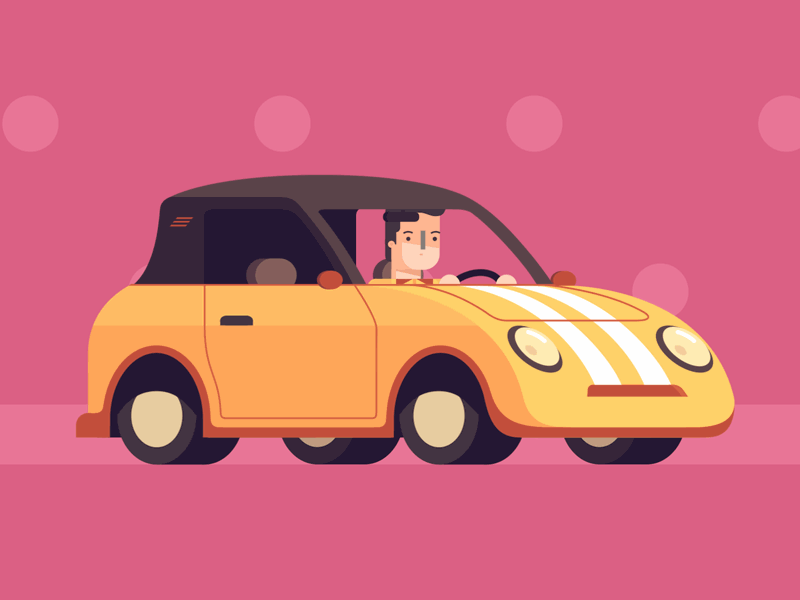